In [1]:
import pandas as pd
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import os

os.chdir('Prueba simplificada-20200926T014032Z-001/Prueba simplificada')

In [2]:
df_test_small       = pd.read_csv('df_[test]_small.csv',sep=',')
df_town_state_small = pd.read_csv('town_state_small.csv',sep=',')
df_cliente_tabla    = pd.read_csv('cliente_tabla.csv',sep=',')
df_candid_small     = pd.read_csv('df_[candidate]_small.csv',sep=',')
df_prod_tabla       = pd.read_csv('producto_tabla.csv',sep=',')

In [3]:
df_candid_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil
3312818,5,1121,1,1035,166404,1125,5,48.0,1,9.6,4


In [4]:
df_candid_small.shape

(7974418, 11)

In [5]:
df_candid_small["n"] = 1

In [6]:
df_candid_small[["Cliente_ID","Producto_ID","Agencia_ID","Semana","Ruta_SAK","n"]].groupby(["Cliente_ID","Producto_ID","Agencia_ID","Semana","Ruta_SAK"]).count()

n
Cliente_ID Producto_ID Agencia_ID Semana Ruta_SAK   
3967       303         1117       3      1606      1
                                  4      1606      1
           323         1117       3      1606      1
                                  4      1606      1
                                  7      1606      1
...                                               ..
99999999   43285       1129       5      600       1
           43341       1129       5      600       1
           43342       1129       3      600       1
           43356       1129       5      600       1
           44371       1129       3      600       1

[7974418 rows x 1 columns]

In [7]:
ls_dfs = [df_test_small,df_town_state_small,df_cliente_tabla,df_candid_small,df_prod_tabla]

In [8]:
i = 0
for df in ls_dfs:
    print(df.shape,'----',i)
    display(df.isnull().sum().to_frame()/len(df),df.info())
    i+=1

(1337913, 6) ---- 0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1337913 entries, 0 to 1337912
Data columns (total 6 columns):
 #   Column       Non-Null Count    Dtype
---  ------       --------------    -----
 0   Semana       1337913 non-null  int64
 1   Agencia_ID   1337913 non-null  int64
 2   Canal_ID     1337913 non-null  int64
 3   Ruta_SAK     1337913 non-null  int64
 4   Cliente_ID   1337913 non-null  int64
 5   Producto_ID  1337913 non-null  int64
dtypes: int64(6)
memory usage: 61.2 MB


,0
Semana,0.0
Agencia_ID,0.0
Canal_ID,0.0
Ruta_SAK,0.0
Cliente_ID,0.0
Producto_ID,0.0


None

(41, 3) ---- 1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41 entries, 0 to 40
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Agencia_ID  41 non-null     int64 
 1   Town        41 non-null     object
 2   State       41 non-null     object
dtypes: int64(1), object(2)
memory usage: 1.1+ KB


,0
Agencia_ID,0.0
Town,0.0
State,0.0


None

(935362, 2) ---- 2
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 935362 entries, 0 to 935361
Data columns (total 2 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   Cliente_ID     935362 non-null  int64 
 1   NombreCliente  935362 non-null  object
dtypes: int64(1), object(1)
memory usage: 14.3+ MB


,0
Cliente_ID,0.0
NombreCliente,0.0


None

(7974418, 12) ---- 3
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7974418 entries, 0 to 7974417
Data columns (total 12 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Semana             int64  
 1   Agencia_ID         int64  
 2   Canal_ID           int64  
 3   Ruta_SAK           int64  
 4   Cliente_ID         int64  
 5   Producto_ID        int64  
 6   Venta_uni_hoy      int64  
 7   Venta_hoy          float64
 8   Dev_uni_proxima    int64  
 9   Dev_proxima        float64
 10  Demanda_uni_equil  int64  
 11  n                  int64  
dtypes: float64(2), int64(10)
memory usage: 730.1 MB


,0
Semana,0.0
Agencia_ID,0.0
Canal_ID,0.0
Ruta_SAK,0.0
Cliente_ID,0.0
Producto_ID,0.0
Venta_uni_hoy,0.0
Venta_hoy,0.0
Dev_uni_proxima,0.0
Dev_proxima,0.0


None

(2592, 2) ---- 4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2592 entries, 0 to 2591
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Producto_ID     2592 non-null   int64 
 1   NombreProducto  2592 non-null   object
dtypes: int64(1), object(1)
memory usage: 40.6+ KB


,0
Producto_ID,0.0
NombreProducto,0.0


None

### Client ID and Names

In [9]:
df_cliente_tabla.shape

(935362, 2)

In [10]:
def limpiar_texto(x):
    x = x.replace("  "," ")
    return x

In [11]:
df_cliente_tabla["NombreCliente"] = list(map(lambda x: limpiar_texto(x),df_cliente_tabla["NombreCliente"]))

In [12]:
len(set(df_cliente_tabla.Cliente_ID.unique()))

930500

In [13]:
ls_dfs = []

for aidi in df_cliente_tabla.Cliente_ID.unique():
    df_aux = df_cliente_tabla[df_cliente_tabla.Cliente_ID==aidi].copy()
    print(i)
    if len(df_aux.NombreCliente.unique())>1:
        display(df_aux)
        ls_dfs.append(df_aux)
        print('-----------****')
    i+=1

In [14]:
dict_cliente_id_name = {45869:"ESC SEC TEC NO 81",211603:"CENTRO DE ABASTOS FANY S A DE C V",447008:"CAFETERIA C A C I R V R M",1646352:"LA CHIQUITA",1662475:"LAPSSUS CAFE"}
df_cliente_tabla["NombreCliente"] = list(map(lambda x,y: dict_cliente_id_name[x] if x in dict_cliente_id_name.keys() else y,
                                             df_cliente_tabla["Cliente_ID"],df_cliente_tabla["NombreCliente"]))

In [15]:
df_cliente_tabla = df_cliente_tabla.drop_duplicates().reset_index(drop=True).copy()

In [16]:
df_candid_small  = df_candid_small.merge(df_cliente_tabla,on='Cliente_ID',how='left')

In [17]:
df_test_small    = df_test_small.merge(df_cliente_tabla,on="Cliente_ID",how="left")

In [18]:
df_test_small.shape

(1337913, 7)

### Producto ID

In [19]:
df_prod_tabla.columns

Index(['Producto_ID', 'NombreProducto'], dtype='object')

In [20]:
for aidi in df_prod_tabla.Producto_ID.unique():
    df_aux = df_prod_tabla[df_prod_tabla.Producto_ID==aidi].copy()
    if len(df_aux.NombreProducto.unique())>1:
        display(df_aux)

In [21]:
df_candid_small  = df_candid_small.merge(df_prod_tabla,on='Producto_ID',how='left')

In [22]:
df_test_small    = df_test_small.merge(df_prod_tabla,on="Producto_ID",how="left")

In [23]:
df_candid_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto
3036464,5,1116,1,2801,319408,37058,10,75.0,0,0.0,10,1,SANTOVEÑA,Choco Roles 2p 80g MTA MLA 37058


In [24]:
df_test_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,NombreCliente,NombreProducto
1047483,9,1137,1,1643,15968,31298,CHAYOTAS,Duo Bigotes 210g TR 31298


### Town and state

In [25]:
df_town_state_small.columns

Index(['Agencia_ID', 'Town', 'State'], dtype='object')

In [26]:
for aidi in df_town_state_small.Agencia_ID.unique():
    df_aux = df_town_state_small[df_town_state_small.Agencia_ID==aidi].copy()
    if len(df_aux.Town.unique())>1  or len(df_aux.State.unique())>1:
        display(df_aux)

In [27]:
df_candid_small  = df_candid_small.merge(df_town_state_small,on='Agencia_ID',how='left')

In [28]:
df_test_small    = df_test_small.merge(df_town_state_small,on='Agencia_ID',how='left')

In [29]:
df_candid_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State
3892417,5,1138,1,1605,1880637,31298,3,26.67,0,0.0,3,1,GAEL,Duo Bigotes 210g TR 31298,2015 AG. ROJO GOMEZ,"MÉXICO, D.F."


In [30]:
df_test_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,NombreCliente,NombreProducto,Town,State
1100387,9,1138,1,4405,1073677,40886,TOÑO,Marias 170g SP CU LAR 40886,2015 AG. ROJO GOMEZ,"MÉXICO, D.F."


In [31]:
df_test_small.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1337913 entries, 0 to 1337912
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   Semana          1337913 non-null  int64 
 1   Agencia_ID      1337913 non-null  int64 
 2   Canal_ID        1337913 non-null  int64 
 3   Ruta_SAK        1337913 non-null  int64 
 4   Cliente_ID      1337913 non-null  int64 
 5   Producto_ID     1337913 non-null  int64 
 6   NombreCliente   1337913 non-null  object
 7   NombreProducto  1337913 non-null  object
 8   Town            1337913 non-null  object
 9   State           1337913 non-null  object
dtypes: int64(6), object(4)
memory usage: 112.3+ MB


In [32]:
df_candid_small.isnull().sum().to_frame()

,0
Semana,0
Agencia_ID,0
Canal_ID,0
Ruta_SAK,0
Cliente_ID,0
Producto_ID,0
Venta_uni_hoy,0
Venta_hoy,0
Dev_uni_proxima,0
Dev_proxima,0


In [33]:
df_candid_small[(df_candid_small.Producto_ID==43064) & (df_candid_small.Agencia_ID==1137) & (df_candid_small.Cliente_ID==316999)]

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State
1116815,3,1137,1,2818,316999,43064,1,8.15,0,0.00,1,1,LA PEQUEÑITA,Submarinos Fresa 3p 105g SP MTA MLA 43064,2014 AG. NEZA,ESTADO DE MÉXICO
2564001,4,1137,1,2818,316999,43064,3,24.45,0,0.00,3,1,LA PEQUEÑITA,Submarinos Fresa 3p 105g SP MTA MLA 43064,2014 AG. NEZA,ESTADO DE MÉXICO
6368770,7,1137,1,2818,316999,43064,2,16.30,1,8.15,1,1,LA PEQUEÑITA,Submarinos Fresa 3p 105g SP MTA MLA 43064,2014 AG. NEZA,ESTADO DE MÉXICO


In [34]:
col = "Venta_uni_hoy-Dev_uni_proxima"
df_candid_small[col] = df_candid_small.Venta_uni_hoy-df_candid_small.Dev_uni_proxima

In [35]:
df_candid_small.sample()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State,Venta_uni_hoy-Dev_uni_proxima
2562811,4,1137,1,2125,1001978,30532,4,31.12,0,0.0,4,1,ELY,Principe 10p 106g Prom MTB MLA 30532,2014 AG. NEZA,ESTADO DE MÉXICO,4


In [36]:
df_candid_small.describe(percentiles=[0.01,0.05,0.95,0.99])

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,Venta_uni_hoy-Dev_uni_proxima
count,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7.974418e+06,7974418.0,7.974418e+06
mean,5.446631e+00,1.126474e+03,1.269744e+00,1.827039e+03,1.426347e+06,1.499695e+04,7.534587e+00,8.140738e+01,1.044087e-01,1.209538e+00,7.460012e+00,1.0,7.430178e+00
std,1.735310e+00,1.243164e+01,1.039153e+00,1.276917e+03,1.522097e+06,1.769279e+04,2.206313e+01,5.859644e+02,3.211733e+00,2.832457e+01,2.190748e+01,0.0,2.209538e+01
min,3.000000e+00,1.110000e+03,1.000000e+00,1.000000e+00,3.967000e+03,5.300000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,-3.360000e+03
1%,3.000000e+00,1.111000e+03,1.000000e+00,6.500000e+01,1.803200e+04,3.030000e+02,1.000000e+00,6.250000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,0.000000e+00
5%,3.000000e+00,1.111000e+03,1.000000e+00,1.009000e+03,5.052600e+04,9.720000e+02,1.000000e+00,8.430000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.0,1.000000e+00
50%,5.000000e+00,1.123000e+03,1.000000e+00,1.433000e+03,8.711310e+05,2.233000e+03,4.000000e+00,3.459000e+01,0.000000e+00,0.000000e+00,4.000000e+00,1.0,4.000000e+00
95%,8.000000e+00,1.153000e+03,4.000000e+00,4.431000e+03,4.539548e+06,4.328500e+04,2.300000e+01,1.994000e+02,0.000000e+00,0.000000e+00,2.300000e+01,1.0,2.300000e+01
99%,8.000000e+00,1.168000e+03,7.000000e+00,6.614000e+03,4.697782e+06,4.841700e+04,6.300000e+01,7.862400e+02,2.000000e+00,2.514000e+01,6.300000e+01,1.0,6.300000e+01
max,8.000000e+00,1.173000e+03,1.100000e+01,9.988000e+03,1.000000e+08,4.999400e+04,4.800000e+03,6.473600e+05,3.360000e+03,4.950000e+04,4.732000e+03,1.0,4.732000e+03


In [38]:
ls_cat = ["Semana","Agencia_ID","Canal_ID","Ruta_SAK","Cliente_ID","Producto_ID","NombreCliente","NombreProducto","Town","State"]
ls_cont= ["Venta_uni_hoy","Venta_hoy","Dev_uni_proxima","Dev_proxima","Demanda_uni_equil","Venta_uni_hoy-Dev_uni_proxima"]

In [39]:
dict_prod = dict(zip(df_prod_tabla.Producto_ID,df_prod_tabla.NombreProducto))

In [41]:
import plotly.express as px

In [42]:
def visualizacion_apc(product_id,cliente_id,agencia_id,df):
    df_aux = df[(df.Producto_ID==product_id) & (df.Cliente_ID==cliente_id) & (df.Agencia_ID==agencia_id)].copy()
    df_aux = df_aux[["Semana"]+ls_cont].groupby(["Semana"]).sum().reset_index()
    ls_sin = [x for x in [1,2,3,4,5,6,8] if x not in df_aux.Semana.unique()]
    display(df_aux)
    if len(ls_sin)>0:
        df_aux = pd.concat([df_aux,pd.DataFrame({"Semana":ls_sin,"Venta_uni_hoy":[0 for x in ls_sin],"Venta_hoy":[0 for x in ls_sin],
                                                "Dev_uni_proxima":[0 for x in ls_sin],"Dev_proxima":[0 for x in ls_sin],
                                                "Demanda_uni_equil":[0 for x in ls_sin]})],sort=True).sort_values(by="Semana").reset_index(drop=True)
    df_aux_ventas = df[(df.Producto_ID==product_id) & (df.Agencia_ID==agencia_id)].copy()[["Semana","Venta_uni_hoy"]]
    df_aux_ventas = df_aux_ventas.groupby(["Semana"]).sum().reset_index()
    df_aux_ventas_cl = df_aux[["Semana","Venta_uni_hoy"]].groupby(["Semana"]).sum().reset_index().rename(columns={"Venta_uni_hoy":"Venta_uni_hoy_cl"})
    df_aux_ventas = df_aux_ventas.merge(df_aux_ventas_cl,on="Semana",how="right")
    df_aux_ventas["Venta_uni_hoy_ratio"] = df_aux_ventas.Venta_uni_hoy_cl/df_aux_ventas.Venta_uni_hoy*100
    fig = px.bar(df_aux_ventas, x='Semana', y='Venta_uni_hoy_ratio')
    fig.update_layout(yaxis_tickformat = '%',title="Porcentaje de ventas del producto "+dict_prod[product_id]+" en la agencia "+str(product_id))
    fig.show()
    
    for col in ls_cont:
        fig = px.line(df_aux, x="Semana", y=col)
        fig.update_layout(title="Serie de tiempo "+col+" "+dict_prod[product_id]+" en la agencia "+str(product_id))
        fig.show()
        fig = px.histogram(df_aux, x=col)
        fig.update_layout(title="Histograma "+col+dict_prod[product_id]+" en la agencia "+str(product_id))
        fig.show()

In [43]:
visualizacion_apc(35452,1222992,1123,df_candid_small)

,Semana,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,Venta_uni_hoy-Dev_uni_proxima
0,3,8,35.52,0,0.0,8,8
1,4,2,8.88,0,0.0,2,2
2,5,4,17.76,0,0.0,4,4
3,8,2,8.88,0,0.0,2,2


### Define a sample of clients that represents a specific agency (Please specify which agency and what were your selection criteria and methodology applied). 


In [44]:
df_candid_small["n"] = 1

In [45]:
df_aux = df_candid_small[["Agencia_ID","Cliente_ID"]].drop_duplicates(subset=["Cliente_ID"]).copy()

In [46]:
df_aux.groupby(["Agencia_ID"]).count().sort_values(by="Cliente_ID",ascending=False)

,Cliente_ID
Agencia_ID,
1123,7949
1126,6738
1117,5664
1130,5601
1140,5391
1122,5187
1153,5031
1119,4521
1137,4255


In [47]:
df_candid_small[["Agencia_ID","Demanda_uni_equil","Venta_uni_hoy"]].groupby(["Agencia_ID"]).sum().sort_values(by=["Demanda_uni_equil","Venta_uni_hoy"],ascending=False)

,Demanda_uni_equil,Venta_uni_hoy
Agencia_ID,,
1129,3209567,3224591
1123,3002597,3035033
1142,2986566,3014662
1114,2902276,3017499
1121,2810077,2827924
1126,2760543,2783455
1117,2676956,2707794
1116,2622081,2644011
1120,2471425,2487607


### Selección de clientes

In [48]:
agencia_id_select = 1123

df_agencia = df_candid_small[df_candid_small.Agencia_ID==agencia_id_select].reset_index(drop=True)

df_agencia_aux = pd.pivot_table(data=df_agencia,index="Cliente_ID",values=ls_cont,aggfunc=["mean","sum","std"]).reset_index()

In [49]:
ls_cols  = [x[1]+'_'+x[0] if x[1]!='' else x[0] for x in df_agencia_aux.columns]

df_agencia_aux.columns = df_agencia_aux.columns.droplevel()

df_agencia_aux.columns = ls_cols

In [50]:
df_agencia_aux.columns

Index(['Cliente_ID', 'Demanda_uni_equil_mean', 'Dev_proxima_mean',
       'Dev_uni_proxima_mean', 'Venta_hoy_mean', 'Venta_uni_hoy_mean',
       'Venta_uni_hoy-Dev_uni_proxima_mean', 'Demanda_uni_equil_sum',
       'Dev_proxima_sum', 'Dev_uni_proxima_sum', 'Venta_hoy_sum',
       'Venta_uni_hoy_sum', 'Venta_uni_hoy-Dev_uni_proxima_sum',
       'Demanda_uni_equil_std', 'Dev_proxima_std', 'Dev_uni_proxima_std',
       'Venta_hoy_std', 'Venta_uni_hoy_std',
       'Venta_uni_hoy-Dev_uni_proxima_std'],
      dtype='object')

In [51]:
df_agencia_aux.describe(percentiles=[0.01,0.05,0.95,0.99])

,Cliente_ID,Demanda_uni_equil_mean,Dev_proxima_mean,Dev_uni_proxima_mean,Venta_hoy_mean,Venta_uni_hoy_mean,Venta_uni_hoy-Dev_uni_proxima_mean,Demanda_uni_equil_sum,Dev_proxima_sum,Dev_uni_proxima_sum,Venta_hoy_sum,Venta_uni_hoy_sum,Venta_uni_hoy-Dev_uni_proxima_sum,Demanda_uni_equil_std,Dev_proxima_std,Dev_uni_proxima_std,Venta_hoy_std,Venta_uni_hoy_std,Venta_uni_hoy-Dev_uni_proxima_std
count,7.950000e+03,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7846.000000,7846.000000,7846.000000,7846.000000,7846.000000,7846.000000
mean,2.068711e+06,4.263649,0.765294,0.082786,35.236827,4.318607,4.235821,377.685157,56.344263,5.766667,3119.834413,381.765157,375.998491,4.504576,2.989033,0.322555,26.118093,4.492884,4.543504
std,1.641379e+06,3.001071,1.665829,0.225000,41.583417,3.000041,3.007373,611.947445,111.230394,11.624141,5414.564609,616.240805,610.864440,4.074839,3.992818,0.525699,41.585923,4.075738,4.078780
min,1.628400e+04,0.000000,0.000000,0.000000,0.000000,0.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1%,1.665989e+05,1.267500,0.000000,0.000000,12.220415,1.428571,1.179091,3.000000,0.000000,0.000000,28.573100,4.000000,3.000000,0.547723,0.000000,0.000000,3.843470,0.536699,0.574820
5%,2.041838e+05,1.934301,0.000000,0.000000,15.670969,2.000000,1.893703,14.000000,0.000000,0.000000,108.534500,14.000000,13.000000,1.137656,0.000000,0.000000,6.981097,1.128219,1.154701
50%,1.595928e+06,3.682179,0.329082,0.031250,27.413736,3.739936,3.666667,209.000000,21.425000,2.000000,1594.410000,212.000000,207.000000,3.524195,2.263240,0.204030,18.278370,3.512999,3.559026
95%,4.640767e+06,7.918137,2.761692,0.296818,68.394773,8.000000,7.875000,1269.550000,219.058500,23.000000,10958.750500,1283.000000,1265.550000,10.197603,9.019686,1.061329,60.707692,10.203797,10.243769
99%,4.729157e+06,15.585000,6.956400,0.833333,194.093541,15.585000,15.438750,2235.060000,473.421600,48.510000,21141.401400,2268.240000,2227.590000,18.503096,16.570256,2.301986,169.255593,18.503096,18.505823
max,1.998863e+07,87.749340,47.520000,9.000000,1140.080833,88.353562,87.736148,33257.000000,3570.840000,264.000000,265555.100000,33486.000000,33252.000000,123.573203,80.359762,15.060197,1564.870949,123.298565,123.582712


### Cleaning dataset

#### Missings

In [52]:
df_agencia_aux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7950 entries, 0 to 7949
Data columns (total 19 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Cliente_ID                          7950 non-null   int64  
 1   Demanda_uni_equil_mean              7950 non-null   float64
 2   Dev_proxima_mean                    7950 non-null   float64
 3   Dev_uni_proxima_mean                7950 non-null   float64
 4   Venta_hoy_mean                      7950 non-null   float64
 5   Venta_uni_hoy_mean                  7950 non-null   float64
 6   Venta_uni_hoy-Dev_uni_proxima_mean  7950 non-null   float64
 7   Demanda_uni_equil_sum               7950 non-null   int64  
 8   Dev_proxima_sum                     7950 non-null   float64
 9   Dev_uni_proxima_sum                 7950 non-null   int64  
 10  Venta_hoy_sum                       7950 non-null   float64
 11  Venta_uni_hoy_sum                   7950 no

In [53]:
df_agencia_aux = df_agencia_aux.fillna(0)

#### Outliers

In [54]:
import seaborn as sns

In [55]:
for col in set(ls_cols).difference(set(["Cliente_ID"])):
        fig = px.histogram(df_agencia_aux, x=col)
        #fig.update_layout(title="Histograma "+col+dict_prod[product_id]+" en la agencia "+str(product_id))
        fig.show()

In [56]:
def cotas(df,col):
    num = 1.5
    q1  = df[col].quantile(0.05)
    q99 = df[col].quantile(0.95)
    iqr = q99-q1
    return q1-num*iqr,q99+num*iqr

In [57]:
ls_cols

['Cliente_ID',
 'Demanda_uni_equil_mean',
 'Dev_proxima_mean',
 'Dev_uni_proxima_mean',
 'Venta_hoy_mean',
 'Venta_uni_hoy_mean',
 'Venta_uni_hoy-Dev_uni_proxima_mean',
 'Demanda_uni_equil_sum',
 'Dev_proxima_sum',
 'Dev_uni_proxima_sum',
 'Venta_hoy_sum',
 'Venta_uni_hoy_sum',
 'Venta_uni_hoy-Dev_uni_proxima_sum',
 'Demanda_uni_equil_std',
 'Dev_proxima_std',
 'Dev_uni_proxima_std',
 'Venta_hoy_std',
 'Venta_uni_hoy_std',
 'Venta_uni_hoy-Dev_uni_proxima_std']

In [58]:
len(ls_cols)

19

In [59]:
cota_inf_Demanda_uni_equil_mean,cota_sup_Demanda_uni_equil_mean = cotas(df_agencia_aux,"Demanda_uni_equil_mean")
cota_inf_Dev_proxima_mean,cota_sup_Dev_proxima_mean = cotas(df_agencia_aux,"Dev_proxima_mean")
cota_inf_Dev_uni_proxima_mean,cota_sup_Dev_uni_proxima_mean = cotas(df_agencia_aux,"Dev_uni_proxima_mean")
cota_inf_Venta_hoy_mean,cota_sup_Venta_hoy_mean = cotas(df_agencia_aux,"Venta_hoy_mean")
cota_inf_Venta_uni_hoy_mean,cota_sup_Venta_uni_hoy_mean = cotas(df_agencia_aux,"Venta_uni_hoy_mean")
cota_inf_Venta_uni_hoy_Dev_uni_proxima_mean,cota_sup_Venta_uni_hoy_Dev_uni_proxima_mean = cotas(df_agencia_aux,"Venta_uni_hoy-Dev_uni_proxima_mean")
cota_inf_Demanda_uni_equil_sum,cota_sup_Demanda_uni_equil_sum = cotas(df_agencia_aux,"Demanda_uni_equil_sum")
cota_inf_Dev_proxima_sum,cota_sup_Dev_proxima_sum = cotas(df_agencia_aux,"Dev_proxima_sum")
cota_inf_Dev_uni_proxima_sum,cota_sup_Dev_uni_proxima_sum = cotas(df_agencia_aux,"Dev_uni_proxima_sum")
cota_inf_Venta_hoy_sum,cota_sup_Venta_hoy_sum = cotas(df_agencia_aux,"Venta_hoy_sum")
cota_inf_Venta_uni_hoy_sum,cota_sup_Venta_uni_hoy_sum = cotas(df_agencia_aux,"Venta_uni_hoy_sum")
cota_inf_Venta_uni_hoy_Dev_uni_proxima_sum,cota_sup_Venta_uni_hoy_Dev_uni_proxima_sum = cotas(df_agencia_aux,"Venta_uni_hoy-Dev_uni_proxima_sum")
cota_inf_Demanda_uni_equil_std,cota_sup_Demanda_uni_equil_std = cotas(df_agencia_aux,"Demanda_uni_equil_std")
cota_inf_Dev_proxima_std,cota_sup_Dev_proxima_std = cotas(df_agencia_aux,"Dev_proxima_std")
cota_inf_Dev_uni_proxima_std,cota_sup_Dev_uni_proxima_std = cotas(df_agencia_aux,"Dev_uni_proxima_std")
cota_inf_Venta_hoy_std,cota_sup_Venta_hoy_std = cotas(df_agencia_aux,"Venta_hoy_std")
cota_inf_Venta_uni_hoy_std,cota_sup_Venta_uni_hoy_std = cotas(df_agencia_aux,"Venta_uni_hoy_std")
cota_inf_Venta_uni_hoy_Dev_uni_proxima_std,cota_sup_Venta_uni_hoy_Dev_uni_proxima_std = cotas(df_agencia_aux,"Venta_uni_hoy-Dev_uni_proxima_std")

In [60]:
len(df_agencia_aux)*(1-0.05)

7552.5

In [61]:
df_agencia_aux_out = df_agencia_aux[(df_agencia_aux["Demanda_uni_equil_mean"]>=cota_inf_Demanda_uni_equil_mean) & (df_agencia_aux["Demanda_uni_equil_mean"]<=cota_sup_Demanda_uni_equil_mean) &
                      (df_agencia_aux["Dev_proxima_mean"]>=cota_inf_Dev_proxima_mean) & (df_agencia_aux["Dev_proxima_mean"]<=cota_sup_Dev_proxima_mean) &
                      (df_agencia_aux["Dev_uni_proxima_mean"]>=cota_inf_Dev_uni_proxima_mean) & (df_agencia_aux["Dev_uni_proxima_mean"]<=cota_sup_Dev_uni_proxima_mean) &
                      (df_agencia_aux["Venta_hoy_mean"]>=cota_inf_Venta_hoy_mean) & (df_agencia_aux["Venta_hoy_mean"]<=cota_sup_Venta_hoy_mean) &
                      (df_agencia_aux["Venta_uni_hoy_mean"]>=cota_inf_Venta_uni_hoy_mean) & (df_agencia_aux["Venta_uni_hoy_mean"]<=cota_sup_Venta_uni_hoy_mean) &
                      (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_mean"]>=cota_inf_Venta_uni_hoy_Dev_uni_proxima_mean) & (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_mean"]<=cota_sup_Venta_uni_hoy_Dev_uni_proxima_mean) &
                      (df_agencia_aux["Demanda_uni_equil_sum"]>=cota_inf_Demanda_uni_equil_sum) & (df_agencia_aux["Demanda_uni_equil_sum"]<=cota_sup_Demanda_uni_equil_sum) &
                      (df_agencia_aux["Dev_proxima_sum"]>=cota_inf_Dev_proxima_sum) & (df_agencia_aux["Dev_proxima_sum"]<=cota_sup_Dev_proxima_sum) &
                      (df_agencia_aux["Dev_uni_proxima_sum"]>=cota_inf_Dev_uni_proxima_sum) & (df_agencia_aux["Dev_uni_proxima_sum"]<=cota_sup_Dev_uni_proxima_sum) &
                      (df_agencia_aux["Venta_hoy_sum"]>=cota_inf_Venta_hoy_sum) & (df_agencia_aux["Venta_hoy_sum"]<=cota_sup_Venta_hoy_sum) &
                      (df_agencia_aux["Venta_uni_hoy_sum"]>=cota_inf_Venta_uni_hoy_sum) & (df_agencia_aux["Venta_uni_hoy_sum"]<=cota_sup_Venta_uni_hoy_sum) &
                      (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_sum"]>=cota_inf_Venta_uni_hoy_Dev_uni_proxima_sum) & (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_sum"]<=cota_sup_Venta_uni_hoy_Dev_uni_proxima_sum) &
                      (df_agencia_aux["Demanda_uni_equil_std"]>=cota_inf_Demanda_uni_equil_std) & (df_agencia_aux["Demanda_uni_equil_std"]<=cota_sup_Demanda_uni_equil_std) &
                      (df_agencia_aux["Dev_proxima_std"]>=cota_inf_Dev_proxima_std) & (df_agencia_aux["Dev_proxima_std"]<=cota_sup_Dev_proxima_std) &
                      (df_agencia_aux["Dev_uni_proxima_std"]>=cota_inf_Dev_uni_proxima_std) & (df_agencia_aux["Dev_uni_proxima_std"]<=cota_sup_Dev_uni_proxima_std) &
                      (df_agencia_aux["Venta_hoy_std"]>=cota_inf_Venta_hoy_std) & (df_agencia_aux["Venta_hoy_std"]<=cota_sup_Venta_hoy_std) &
                      (df_agencia_aux["Venta_uni_hoy_std"]>=cota_inf_Venta_uni_hoy_std) & (df_agencia_aux["Venta_uni_hoy_std"]<=cota_sup_Venta_uni_hoy_std) &
                      (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_std"]>=cota_inf_Venta_uni_hoy_Dev_uni_proxima_std) & (df_agencia_aux["Venta_uni_hoy-Dev_uni_proxima_std"]<=cota_sup_Venta_uni_hoy_Dev_uni_proxima_std)].copy()

In [62]:
len(df_agencia_aux_out)

7567

In [63]:
for col in set(ls_cols).difference(set(["Cliente_ID"])):
        fig = px.histogram(df_agencia_aux_out, x=col)
        #fig.update_layout(title="Histograma "+col+dict_prod[product_id]+" en la agencia "+str(product_id))
        fig.show()

In [64]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [65]:
sc = StandardScaler()

X = df_agencia_aux_out[[x for x in df_agencia_aux_out.columns if x!="Cliente_ID"]].copy()

sc.fit(X)

X = pd.DataFrame(sc.transform(X))

X.columns = [x for x in df_agencia_aux_out.columns if x!="Cliente_ID"]

In [66]:
pca =  PCA(n_components=3)

pca.fit(X)
print(pca.explained_variance_ratio_.sum())

Xpca = pd.DataFrame(pca.transform(X))

fig = px.scatter_3d(Xpca,x=0,y=1,z=1,color=0)
#fig.update_layout(title="Histograma "+col+dict_prod[product_id]+" en la agencia "+str(product_id))
fig.show()

0.8679104291908029


In [67]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

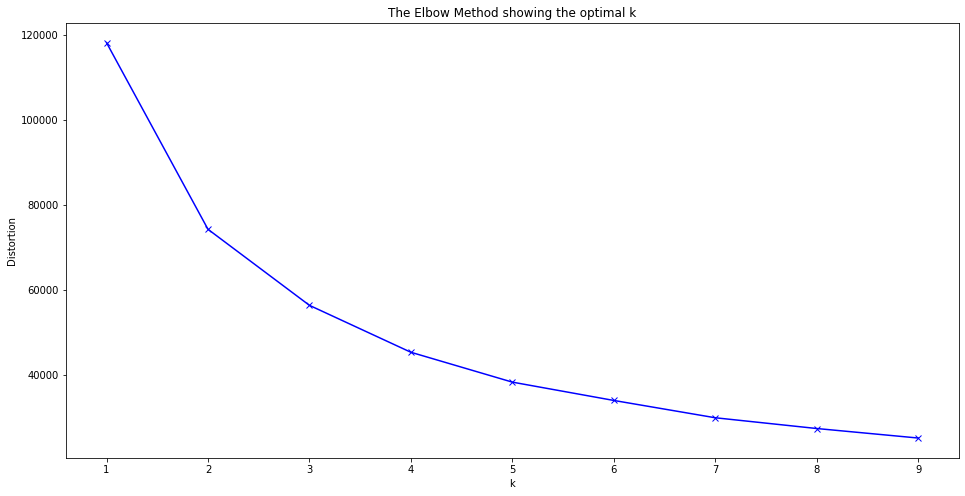

In [68]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Xpca)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [69]:
km = KMeans(n_clusters=3)

X["km"] = km.fit_predict(Xpca)



X["Cliente_ID"] = df_agencia_aux_out.Cliente_ID

In [70]:
display(X.groupby(["km"]).mean())

,Demanda_uni_equil_mean,Dev_proxima_mean,Dev_uni_proxima_mean,Venta_hoy_mean,Venta_uni_hoy_mean,Venta_uni_hoy-Dev_uni_proxima_mean,Demanda_uni_equil_sum,Dev_proxima_sum,Dev_uni_proxima_sum,Venta_hoy_sum,Venta_uni_hoy_sum,Venta_uni_hoy-Dev_uni_proxima_sum,Demanda_uni_equil_std,Dev_proxima_std,Dev_uni_proxima_std,Venta_hoy_std,Venta_uni_hoy_std,Venta_uni_hoy-Dev_uni_proxima_std,Cliente_ID
km,,,,,,,,,,,,,,,,,,,
0,-0.390658,-0.395931,-0.389772,-0.327365,-0.405040,-0.383325,-0.421809,-0.448066,-0.447393,-0.398258,-0.424905,-0.420236,-0.433290,-0.439861,-0.426238,-0.362988,-0.432230,-0.439270,2.091450e+06
1,-0.302506,1.683550,1.658176,-0.195634,-0.244175,-0.332384,-0.195900,1.123923,1.147510,-0.167736,-0.181054,-0.203514,-0.077472,1.551652,1.525295,-0.094463,-0.082571,-0.050280,1.774653e+06
2,1.282482,-0.115393,-0.114176,1.033553,1.280298,1.283694,1.291785,0.425002,0.406392,1.207412,1.289688,1.292903,1.238942,0.098429,0.079950,1.058941,1.239672,1.235944,1.544685e+06


In [71]:
df_agencia_sample = df_candid_small[(df_candid_small.Cliente_ID.isin(X[(X.km==1)].Cliente_ID.unique())) & (df_candid_small.Agencia_ID==agencia_id_select)].reset_index(drop=True).copy()

In [72]:
df_agencia_sample

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State,Venta_uni_hoy-Dev_uni_proxima
0,3,1123,1,1001,579781,1160,1,18.86,0,0.00,1,1,FRANCO,Bimbollos 8p 450g BIM 1160,2094 CHALCO_BM,ESTADO DE MÉXICO,1
1,3,1123,1,1001,579781,2233,2,39.88,0,0.00,2,1,FRANCO,Pan Blanco 640g BIM 2233,2094 CHALCO_BM,ESTADO DE MÉXICO,2
2,3,1123,1,1001,579781,46772,6,53.52,0,0.00,6,1,FRANCO,Pan Molido 210g BIM 46772,2094 CHALCO_BM,ESTADO DE MÉXICO,6
3,3,1123,1,1001,1037578,693,3,28.80,0,0.00,3,1,RANCHO CHICO,Tostada Plana 15p 175g MR 693,2094 CHALCO_BM,ESTADO DE MÉXICO,3
4,3,1123,1,1001,1037578,1109,1,15.01,0,0.00,1,1,RANCHO CHICO,Pan Blanco Chico 360g BIM 1109,2094 CHALCO_BM,ESTADO DE MÉXICO,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92753,8,1123,1,4425,1799323,43066,1,9.63,0,0.00,1,1,WENDY,Pay Pina 1p 85g MTB MLA 43066,2094 CHALCO_BM,ESTADO DE MÉXICO,1
92754,8,1123,1,4425,1799323,43215,2,20.28,0,0.00,2,1,WENDY,Pastisetas 75g MTB SUA 43215,2094 CHALCO_BM,ESTADO DE MÉXICO,2
92755,8,1123,1,4425,1799323,43285,7,36.96,0,0.00,7,1,WENDY,Gansito 1p 50g MTB MLA 43285,2094 CHALCO_BM,ESTADO DE MÉXICO,7
92756,8,1123,1,4425,1836258,43065,0,0.00,2,13.52,0,1,IMPERIO DE AGUILAS,Rollo Fresa 2p 75g MTA MLA 43065,2094 CHALCO_BM,ESTADO DE MÉXICO,-2


In [73]:
df_agencia_sample_prod = df_agencia_sample[["Venta_uni_hoy","NombreProducto"]].groupby(["NombreProducto"]).sum().sort_values(by="Venta_uni_hoy",ascending=False)

In [74]:
ls_top3_sold = df_agencia_sample_prod.head(3).index.tolist()

In [75]:
df_agencia_sample_prod.reset_index().head(10)

,NombreProducto,Venta_uni_hoy
0,Nito 1p 62g BIM 1278,49770
1,Rebanada 2p 55g BIM 1284,39903
2,Donas Azucar 4p 105g BIM 1250,18359
3,Gansito 1p 50g MTB MLA 43285,17370
4,Polvoroncitos Panera 40p 16 25g TR 45143,16833
5,Madalenas 3p 93g BIM 35651,15524
6,Mantecadas Vainilla 4p 125g BIM 1240,15520
7,Donitas Espolvoreadas 6p 105g BIM 1242,11734
8,Pan Blanco 640g BIM 2233,11291
9,Pan Molido 210g BIM 46772,9073


In [76]:
px.pie(data_frame=df_agencia_sample_prod.reset_index().head(10),values="Venta_uni_hoy",names='NombreProducto')

### Forecast top3 sold productos 

In [77]:
ls_top3_sold

['Nito 1p 62g BIM 1278',
 'Rebanada 2p 55g BIM 1284',
 'Donas Azucar 4p 105g BIM 1250']

In [78]:
df_candid_small_prod = df_candid_small[df_candid_small.NombreProducto.isin(ls_top3_sold)].copy().reset_index(drop=True)

In [79]:
df_candid_small_prod.shape

(763322, 17)

In [80]:
df_candid_small_prod.Producto_ID.unique()

array([1250, 1278, 1284])

In [81]:
df_candid_small_prod

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,NombreCliente,NombreProducto,Town,State,Venta_uni_hoy-Dev_uni_proxima
0,3,1110,7,3301,15766,1250,5,38.20,0,0.0,5,1,PUESTO DE PERIODICOS LAZARO,Donas Azucar 4p 105g BIM 1250,2008 AG. LAGO FILT,"MÉXICO, D.F.",5
1,3,1110,7,3301,73589,1250,3,22.92,0,0.0,3,1,PTO REV NOEMI,Donas Azucar 4p 105g BIM 1250,2008 AG. LAGO FILT,"MÉXICO, D.F.",3
2,3,1110,7,3301,73650,1250,4,30.56,0,0.0,4,1,LUIS,Donas Azucar 4p 105g BIM 1250,2008 AG. LAGO FILT,"MÉXICO, D.F.",4
3,3,1110,7,3301,73838,1250,7,53.48,0,0.0,7,1,PTO REV JOSE CARLOS,Donas Azucar 4p 105g BIM 1250,2008 AG. LAGO FILT,"MÉXICO, D.F.",7
4,3,1110,7,3301,181232,1250,2,15.28,0,0.0,2,1,DELICITY CAFE,Donas Azucar 4p 105g BIM 1250,2008 AG. LAGO FILT,"MÉXICO, D.F.",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763317,8,1173,4,6609,4450510,1250,10,74.10,0,0.0,10,1,NO IDENTIFICADO,Donas Azucar 4p 105g BIM 1250,2004 AG. CUAUTITLAN,ESTADO DE MÉXICO,10
763318,8,1173,4,6609,4461884,1250,9,66.69,0,0.0,9,1,NO IDENTIFICADO,Donas Azucar 4p 105g BIM 1250,2004 AG. CUAUTITLAN,ESTADO DE MÉXICO,9
763319,8,1173,4,6609,4461885,1250,10,74.10,0,0.0,10,1,NO IDENTIFICADO,Donas Azucar 4p 105g BIM 1250,2004 AG. CUAUTITLAN,ESTADO DE MÉXICO,10
763320,8,1173,4,6609,4461886,1250,13,96.33,0,0.0,13,1,NO IDENTIFICADO,Donas Azucar 4p 105g BIM 1250,2004 AG. CUAUTITLAN,ESTADO DE MÉXICO,13


In [82]:
df_candid_small.shape

(7974418, 17)

#### Converting discrete variables in dummy variables to get continuos variables

In [83]:
for col in ls_cat:
    print(col,len(df_candid_small_prod[col].unique()))

Semana 6
Agencia_ID 34
Canal_ID 6
Ruta_SAK 367
Cliente_ID 71113
Producto_ID 3
NombreCliente 23233
NombreProducto 3
Town 21
State 3


In [84]:
df_candid_small_prod = df_candid_small_prod.rename(columns={"Venta_uni_hoy-Dev_uni_proxima":"Demanda"})

In [85]:
df_dumm_agenciaid = pd.get_dummies(df_candid_small_prod["Agencia_ID"])
df_dumm_agenciaid.columns = ['Agencia_ID_'+str(x) for x in df_dumm_agenciaid.columns]
df_dumm_canalid = pd.get_dummies(df_candid_small_prod["Canal_ID"])
df_dumm_canalid.columns = ['Canal_ID_'+str(x) for x in df_dumm_canalid.columns]
df_dumm_rutasak = pd.get_dummies(df_candid_small_prod["Ruta_SAK"])
df_dumm_rutasak.columns = ['Ruta_SAK_'+str(x) for x in df_dumm_rutasak.columns]
df_dumm_town = pd.get_dummies(df_candid_small_prod["Town"])
df_dumm_town.columns = ['Town_'+x for x in df_dumm_town.columns]
df_dumm_state = pd.get_dummies(df_candid_small_prod["State"])
df_dumm_state.columns = ['State_'+x for x in df_dumm_state.columns]

df_candid_small_prod = df_dumm_agenciaid.join([df_dumm_canalid,df_dumm_rutasak,df_dumm_town,df_dumm_state,df_candid_small_prod[["Demanda"]]])

In [87]:
df_candid_small_prod.shape

(763322, 432)

In [88]:
df_candid_small_prod = df_candid_small_prod.groupby([x for x in df_candid_small_prod.columns if x!="Demanda"]).quantile(0.95)

df_candid_small_prod = df_candid_small_prod.reset_index()

df_candid_small_prod.describe()

,Agencia_ID_1110,Agencia_ID_1111,Agencia_ID_1112,Agencia_ID_1113,Agencia_ID_1116,Agencia_ID_1117,Agencia_ID_1118,Agencia_ID_1119,Agencia_ID_1120,Agencia_ID_1121,Agencia_ID_1122,Agencia_ID_1123,Agencia_ID_1124,Agencia_ID_1126,Agencia_ID_1127,Agencia_ID_1130,Agencia_ID_1137,Agencia_ID_1138,Agencia_ID_1139,Agencia_ID_1140,Agencia_ID_1143,Agencia_ID_1146,Agencia_ID_1147,Agencia_ID_1150,Agencia_ID_1152,Agencia_ID_1153,Agencia_ID_1155,Agencia_ID_1159,Agencia_ID_1164,Agencia_ID_1165,Agencia_ID_1170,Agencia_ID_1171,Agencia_ID_1172,Agencia_ID_1173,Canal_ID_1,Canal_ID_4,Canal_ID_6,Canal_ID_7,Canal_ID_8,Canal_ID_11,Ruta_SAK_1101,Ruta_SAK_1102,Ruta_SAK_1103,Ruta_SAK_1104,Ruta_SAK_1105,Ruta_SAK_1106,Ruta_SAK_1107,Ruta_SAK_1108,Ruta_SAK_1109,Ruta_SAK_1110,...,Ruta_SAK_6613,Ruta_SAK_6614,Ruta_SAK_6615,Ruta_SAK_6616,Ruta_SAK_6617,Ruta_SAK_6618,Ruta_SAK_6619,Ruta_SAK_6620,Ruta_SAK_6621,Ruta_SAK_6622,Ruta_SAK_6623,Ruta_SAK_6624,Ruta_SAK_6625,Ruta_SAK_6626,Ruta_SAK_6627,Ruta_SAK_6628,Ruta_SAK_6629,Ruta_SAK_6630,Ruta_SAK_6631,Ruta_SAK_6632,Ruta_SAK_6633,Ruta_SAK_6634,Ruta_SAK_6635,Ruta_SAK_6636,Ruta_SAK_6637,Town_2001 AG. ATIZAPAN,Town_2002 AG. AZCAPOTZALCO,Town_2003 AG. COACALCO,Town_2004 AG. CUAUTITLAN,Town_2007 AG. LA VILLA,Town_2008 AG. LAGO FILT,Town_2010 AG. LOS REYES,Town_2011 AG. SAN ANTONIO,Town_2013 AG. MEGA NAUCALPAN,Town_2014 AG. NEZA,Town_2015 AG. ROJO GOMEZ,Town_2016 AG. SAN LORENZO,Town_2017 AG. SANTA CLARA,Town_2018 AG. TEPALCATES 2,Town_2019 AG. XALOSTOC,Town_2021 AG. XOCHIMILCO 2,Town_2048 AG. IXTAPALUCA 1,Town_2078 AG. TEXCOCO,Town_2087 AG. TIZAYUCA,Town_2088 AG. CEYLAN,Town_2094 CHALCO_BM,State_ESTADO DE MÉXICO,State_HIDALGO,"State_MÉXICO, D.F.",Demanda
count,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,...,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000,1239.000000
mean,0.020178,0.029056,0.020178,0.014528,0.052462,0.049233,0.039548,0.046812,0.028249,0.032284,0.050847,0.059726,0.065375,0.062147,0.031477,0.033898,0.032284,0.021792,0.021792,0.058918,0.020985,0.012914,0.009685,0.029863,0.016949,0.079903,0.008071,0.006457,0.009685,0.012914,0.006457,0.002421,0.005650,0.007264,0.808717,0.105730,0.025827,0.046005,0.004036,0.009685,0.002421,0.001614,0.001614,0.000807,0.000807,0.000807,0.000807,0.000807,0.001614,0.000807,...,0.002421,0.002421,0.002421,0.002421,0.001614,0.001614,0.001614,0.001614,0.001614,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.000807,0.058111,0.029056,0.049233,0.033091,0.039548,0.051655,0.046812,0.088781,0.068604,0.032284,0.021792,0.032284,0.062147,0.028249,0.050847,0.065375,0.009685,0.058918,0.079903,0.033898,0.059726,0.529459,0.079903,0.390638,36.011340
std,0.140664,0.168030,0.140664,0.119701,0.223046,0.216442,0.194973,0.211321,0.165749,0.176825,0.219775,0.237073,0.247287,0.241520,0.174673,0.181041,0.176825,0.146062,0.146062,0.235567,0.143391,0.112

In [90]:
df_candid_small[df_candid_small.NombreProducto.isin(ls_top3_sold)].describe()

,Semana,Agencia_ID,Canal_ID,Ruta_SAK,Cliente_ID,Producto_ID,Venta_uni_hoy,Venta_hoy,Dev_uni_proxima,Dev_proxima,Demanda_uni_equil,n,Venta_uni_hoy-Dev_uni_proxima
count,763322.000000,763322.000000,763322.000000,763322.000000,7.633220e+05,763322.000000,763322.000000,763322.000000,763322.000000,763322.000000,763322.000000,763322.0,763322.000000
mean,5.523416,1125.410487,1.091083,1458.194387,1.527166e+06,1270.052782,12.698351,62.295326,0.058915,0.307221,12.651476,1.0,12.639437
std,1.717565,10.548580,0.657409,610.236057,1.543224e+06,14.839775,14.018216,73.714224,0.917931,4.673623,14.007925,0.0,14.029585
min,3.000000,1110.000000,1.000000,1101.000000,3.967000e+03,1250.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,-137.000000
25%,4.000000,1118.000000,1.000000,1255.000000,3.554010e+05,1250.000000,5.000000,22.920000,0.000000,0.000000,5.000000,1.0,5.000000
50%,6.000000,1123.000000,1.000000,1419.000000,9.812580e+05,1278.000000,10.000000,45.000000,0.000000,0.000000,10.000000,1.0,10.000000
75%,7.000000,1130.000000,1.000000,1457.000000,2.178805e+06,1284.000000,16.000000,76.400000,0.000000,0.000000,16.000000,1.0,16.000000
max,8.000000,1173.000000,11.000000,6637.000000,1.998863e+07,1284.000000,1236.000000,8182.440000,161.000000,724.500000,1236.000000,1.0,1236.000000


In [91]:
from sklearn.model_selection import train_test_split

In [92]:
ls_cols = [x for x in df_candid_small_prod.columns if x!="Demanda"]

X = df_candid_small_prod.copy()

y = df_candid_small_prod[["Demanda"]].copy()

In [93]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

#### Kneighbors

In [94]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt

In [95]:
kn = KNeighborsRegressor()

In [96]:
kn.fit(X_train[ls_cols], y_train)

KNeighborsRegressor()

In [97]:
mse = mean_squared_error(y_train, kn.predict(X_train[ls_cols]))
mae = mean_absolute_error(y_train, kn.predict(X_train[ls_cols]))

print("mse = ",mse," & mae = ",mae," & rmse = ", sqrt(mse))

mse =  383.04972701829746  & mae =  10.023272335844988  & rmse =  19.571656215514757


In [98]:
mse = mean_squared_error(y_test, kn.predict(X_test[ls_cols]))
mae = mean_absolute_error(y_test, kn.predict(X_test[ls_cols]))

print("mse = ",mse," & mae = ",mae," & rmse = ", sqrt(mse))

mse =  208.48394935483853  & mae =  9.868483870967738  & rmse =  14.438973279109513


#### Randome forest and decision tree

In [99]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [100]:
tree_model = DecisionTreeRegressor()
rf_model = RandomForestRegressor()

In [101]:
tree_model.fit(X_train[ls_cols], y_train)
rf_model.fit(X_train[ls_cols], y_train)

/home/alejandro/Documentos/python/env36/lib/python3.6/site-packages/ipykernel_launcher.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestRegressor()

In [105]:
tree_mse = mean_squared_error(y_train, tree_model.predict(X_train[ls_cols]))
tree_mae = mean_absolute_error(y_train, tree_model.predict(X_train[ls_cols]))
rf_mse = mean_squared_error(y_train, rf_model.predict(X_train[ls_cols]))
rf_mae = mean_absolute_error(y_train, rf_model.predict(X_train[ls_cols]))

print("Decision Tree training mse = ",tree_mse," & mae = ",tree_mae," & rmse = ", sqrt(tree_mse))
print("Random Forest training mse = ",rf_mse," & mae = ",rf_mae," & rmse = ", sqrt(rf_mse))

Decision Tree training mse =  0.0  & mae =  0.0  & rmse =  0.0
Random Forest training mse =  92.15431441926742  & mae =  3.9632572658772824  & rmse =  9.599703871436214


In [104]:
tree_mse = mean_squared_error(y_test, tree_model.predict(X_test[ls_cols]))
tree_mae = mean_absolute_error(y_test, tree_model.predict(X_test[ls_cols]))
rf_mse = mean_squared_error(y_test, rf_model.predict(X_test[ls_cols]))
rf_mae = mean_absolute_error(y_test, rf_model.predict(X_test[ls_cols]))

print("Decision Tree testing mse = ",tree_mse," & mae = ",tree_mae," & rmse = ", sqrt(tree_mse))
print("Random Forest testing mse = ",rf_mse," & mae = ",rf_mae," & rmse = ", sqrt(rf_mse))

Decision Tree testing mse =  228.2380967741934  & mae =  9.573548387096771  & rmse =  15.107550985324968
Random Forest testing mse =  170.67292366209665  & mae =  8.243895161290318  & rmse =  13.064184768369461


In [135]:
import pickle

In [136]:
pickle.dump(rf_model,open("random_forest",'wb'))

#### Regresión lineal

In [106]:
from sklearn.linear_model import LinearRegression

In [128]:
sc = StandardScaler()

X_trainsc = pd.DataFrame(sc.fit_transform(X_train[ls_cols]))
X_trainsc.columns = ls_cols
X_testsc = pd.DataFrame((sc.transform(X_test[ls_cols])))
X_testsc.columns = ls_cols

In [129]:
lr = LinearRegression()
lr.fit(X_trainsc, y_train)

LinearRegression()

In [130]:
mse = mean_squared_error(y_train, lr.predict(X_trainsc[ls_cols]))
mae = mean_absolute_error(y_train, lr.predict(X_trainsc[ls_cols]))
print("mse = ",mse," & mae = ",mae," & rmse = ", sqrt(mse))

mse =  381.92295291408226  & mae =  10.75538995294374  & rmse =  19.5428491503691


In [133]:
test_mse = mean_squared_error(y_test, lr.predict(X_testsc[ls_cols]))
test_mae = mean_absolute_error(y_test, lr.predict(X_testsc[ls_cols]))
print("mse = ",test_mse," & mae = ",test_mae," & rmse = ", sqrt(test_mse))

mse =  3.838667187408898e+29  & mae =  162925612500688.03  & rmse =  619569785206549.4


In [254]:
X_train["Demanda_clf"] = clf.predict(X_train[ls_cols])

/home/alejandro/Documentos/python/env36/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [255]:
X_train.describe()

,Agencia_ID_1110,Agencia_ID_1111,Agencia_ID_1112,Agencia_ID_1113,Agencia_ID_1116,Agencia_ID_1117,Agencia_ID_1118,Agencia_ID_1119,Agencia_ID_1120,Agencia_ID_1121,Agencia_ID_1122,Agencia_ID_1123,Agencia_ID_1124,Agencia_ID_1126,Agencia_ID_1127,Agencia_ID_1130,Agencia_ID_1137,Agencia_ID_1138,Agencia_ID_1139,Agencia_ID_1140,Agencia_ID_1143,Agencia_ID_1153,Agencia_ID_1164,Agencia_ID_1165,Canal_ID_1,Canal_ID_6,Canal_ID_7,Canal_ID_8,Canal_ID_11,Ruta_SAK_1101,Ruta_SAK_1102,Ruta_SAK_1103,Ruta_SAK_1104,Ruta_SAK_1105,Ruta_SAK_1106,Ruta_SAK_1107,Ruta_SAK_1108,Ruta_SAK_1109,Ruta_SAK_1110,Ruta_SAK_1111,Ruta_SAK_1112,Ruta_SAK_1113,Ruta_SAK_1114,Ruta_SAK_1115,Ruta_SAK_1116,Ruta_SAK_1117,Ruta_SAK_1118,Ruta_SAK_1119,Ruta_SAK_1120,Ruta_SAK_1121,...,Ruta_SAK_1637,Ruta_SAK_1638,Ruta_SAK_1639,Ruta_SAK_1640,Ruta_SAK_1641,Ruta_SAK_1642,Ruta_SAK_1643,Ruta_SAK_1644,Ruta_SAK_1645,Ruta_SAK_2812,Ruta_SAK_3204,Ruta_SAK_3215,Ruta_SAK_3239,Ruta_SAK_3306,Ruta_SAK_3320,Ruta_SAK_3330,Ruta_SAK_3332,Ruta_SAK_3334,Ruta_SAK_3335,Ruta_SAK_3339,Ruta_SAK_3340,Ruta_SAK_3401,Ruta_SAK_3503,Ruta_SAK_4501,Town_2001 AG. ATIZAPAN,Town_2002 AG. AZCAPOTZALCO,Town_2003 AG. COACALCO,Town_2004 AG. CUAUTITLAN,Town_2007 AG. LA VILLA,Town_2008 AG. LAGO FILT,Town_2010 AG. LOS REYES,Town_2011 AG. SAN ANTONIO,Town_2013 AG. MEGA NAUCALPAN,Town_2014 AG. NEZA,Town_2015 AG. ROJO GOMEZ,Town_2016 AG. SAN LORENZO,Town_2017 AG. SANTA CLARA,Town_2018 AG. TEPALCATES 2,Town_2019 AG. XALOSTOC,Town_2021 AG. XOCHIMILCO 2,Town_2048 AG. IXTAPALUCA 1,Town_2078 AG. TEXCOCO,Town_2087 AG. TIZAYUCA,Town_2088 AG. CEYLAN,Town_2094 CHALCO_BM,State_ESTADO DE MÉXICO,State_HIDALGO,"State_MÉXICO, D.F.",Demanda,Demanda_clf
count,951.0,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.0,951.000000,951.000000,951.000000,951.0,951.000000,951.0,951.0,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,...,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.0,951.000000,951.0,951.000000,951.0,951.000000,951.000000,951.0,951.000000,951.000000,951.000000,951.0,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000
mean,0.0,0.039958,0.029443,0.019979,0.067298,0.059937,0.042061,0.041009,0.047319,0.047319,0.051525,0.078864,0.077813,0.050473,0.029443,0.054679,0.050473,0.034700,0.002103,0.075710,0.001052,0.092534,0.001052,0.005258,0.990536,0.002103,0.005258,0.001052,0.001052,0.003155,0.001052,0.001052,0.001052,0.001052,0.001052,0.001052,0.0,0.002103,0.001052,0.001052,0.0,0.001052,0.0,0.0,0.001052,0.001052,0.001052,0.001052,0.002103,0.002103,...,0.002103,0.001052,0.001052,0.001052,0.002103,0.001052,0.001052,0.001052,0.001052,0.0,0.001052,0.0,0.001052,0.0,0.001052,0.001052,0.0,0.001052,0.001052,0.001052,0.0,0.001052,0.001052,0.003155,0.059937,0.039958,0.029443,0.029443,0.042061,0.019979,0.059937,0.067298,0.043113,0.050473,0.034700,0.047319,0.050473,0.047319,0.051525,0.077813,0.001052,0.075710,0.092534,0.001052,0.078864,0.529968,0.092534,0.377497,22.877199,22.877199
std,0.0,0.195963,0.169133,0.140002,0.250668,0.237495,0.200834,0.198416,0.212431,0.212431,0.221182,0.269669,0.268018,0.219034,0.169133,0.227473,0.219034,0.183116,0.045835,0.264672,0.032427,0.289931,0.032427,0.072357,0.096871,0.045835,0.072357,0.032427,0.032427,0.056106,0.032427,0.032427,0.032427,0.032427,0.032427,0.032427,0.0,0.045835,0.032427,0.032427,0.0,0.032427,0.0,0.0,0.032427,0.032427,0.032427,0.032427,0.045

In [228]:
df_candid_small_prod.describe()

,Agencia_ID_1110,Agencia_ID_1111,Agencia_ID_1112,Agencia_ID_1113,Agencia_ID_1116,Agencia_ID_1117,Agencia_ID_1118,Agencia_ID_1119,Agencia_ID_1120,Agencia_ID_1121,Agencia_ID_1122,Agencia_ID_1123,Agencia_ID_1124,Agencia_ID_1126,Agencia_ID_1127,Agencia_ID_1130,Agencia_ID_1137,Agencia_ID_1138,Agencia_ID_1139,Agencia_ID_1140,Agencia_ID_1143,Agencia_ID_1153,Agencia_ID_1164,Agencia_ID_1165,Canal_ID_1,Canal_ID_6,Canal_ID_7,Canal_ID_8,Canal_ID_11,Ruta_SAK_1101,Ruta_SAK_1102,Ruta_SAK_1103,Ruta_SAK_1104,Ruta_SAK_1105,Ruta_SAK_1106,Ruta_SAK_1107,Ruta_SAK_1108,Ruta_SAK_1109,Ruta_SAK_1110,Ruta_SAK_1111,Ruta_SAK_1112,Ruta_SAK_1113,Ruta_SAK_1114,Ruta_SAK_1115,Ruta_SAK_1116,Ruta_SAK_1117,Ruta_SAK_1118,Ruta_SAK_1119,Ruta_SAK_1120,Ruta_SAK_1121,...,Ruta_SAK_1636,Ruta_SAK_1637,Ruta_SAK_1638,Ruta_SAK_1639,Ruta_SAK_1640,Ruta_SAK_1641,Ruta_SAK_1642,Ruta_SAK_1643,Ruta_SAK_1644,Ruta_SAK_1645,Ruta_SAK_2812,Ruta_SAK_3204,Ruta_SAK_3215,Ruta_SAK_3239,Ruta_SAK_3306,Ruta_SAK_3320,Ruta_SAK_3330,Ruta_SAK_3332,Ruta_SAK_3334,Ruta_SAK_3335,Ruta_SAK_3339,Ruta_SAK_3340,Ruta_SAK_3401,Ruta_SAK_3503,Ruta_SAK_4501,Town_2001 AG. ATIZAPAN,Town_2002 AG. AZCAPOTZALCO,Town_2003 AG. COACALCO,Town_2004 AG. CUAUTITLAN,Town_2007 AG. LA VILLA,Town_2008 AG. LAGO FILT,Town_2010 AG. LOS REYES,Town_2011 AG. SAN ANTONIO,Town_2013 AG. MEGA NAUCALPAN,Town_2014 AG. NEZA,Town_2015 AG. ROJO GOMEZ,Town_2016 AG. SAN LORENZO,Town_2017 AG. SANTA CLARA,Town_2018 AG. TEPALCATES 2,Town_2019 AG. XALOSTOC,Town_2021 AG. XOCHIMILCO 2,Town_2048 AG. IXTAPALUCA 1,Town_2078 AG. TEXCOCO,Town_2087 AG. TIZAYUCA,Town_2088 AG. CEYLAN,Town_2094 CHALCO_BM,State_ESTADO DE MÉXICO,State_HIDALGO,"State_MÉXICO, D.F.",Demanda
count,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,...,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000,1269.000000
mean,0.000788,0.043341,0.029157,0.021277,0.068558,0.068558,0.038613,0.045705,0.043341,0.047281,0.049645,0.074862,0.077226,0.060678,0.030733,0.050433,0.048857,0.032309,0.001576,0.070134,0.001576,0.089046,0.000788,0.005516,0.989756,0.002364,0.006304,0.000788,0.000788,0.002364,0.001576,0.001576,0.000788,0.000788,0.000788,0.000788,0.000788,0.001576,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.001576,0.000788,0.000788,0.000788,0.001576,0.001576,...,0.002364,0.001576,0.000788,0.001576,0.002364,0.001576,0.001576,0.001576,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.000788,0.003152,0.068558,0.043341,0.030733,0.029157,0.038613,0.022065,0.055950,0.068558,0.047281,0.048857,0.032309,0.047281,0.060678,0.043341,0.049645,0.077226,0.000788,0.070134,0.089046,0.001576,0.074862,0.536643,0.089046,0.374310,22.912040
std,0.028072,0.203704,0.168312,0.144362,0.252800,0.252800,0.192747,0.208928,0.203704,0.212324,0.217297,0.263272,0.267055,0.238832,0.172661,0.218924,0.215655,0.176889,0.039684,0.255473,0.039684,0.284923,0.028072,0.07

In [124]:
df_aux.describe()

,Demanda
count,1269.000000
mean,22.912040
std,19.433513
min,2.000000
25%,12.129808
50%,15.555556
75%,19.564453
max,160.000000


In [127]:
df_candid_small[df_candid_small.NombreProducto.isin(ls_top3_sold)].shape

(528112, 17)

In [126]:
df_candid_small[df_candid_small.NombreProducto.isin(ls_top3_sold)][["Venta_uni_hoy-Dev_uni_proxima"]].describe()

,Venta_uni_hoy-Dev_uni_proxima
count,528112.000000
mean,16.468031
std,18.829477
min,-280.000000
25%,6.000000
50%,11.000000
75%,20.000000
max,1236.000000


In [116]:
fig = px.histogram(df_candid_small_prod.Demanda)
fig.update_layout(title="Histograma demanda")
fig.show()
fig = px.line(y=df_candid_small_prod.Demanda)
#fig.update_layout(title="Histograma demanda")
fig.show()

In [100]:
df_candid_small_prod.corr()

,Agencia_ID_1110,Agencia_ID_1111,Agencia_ID_1112,Agencia_ID_1113,Agencia_ID_1116,Agencia_ID_1117,Agencia_ID_1118,Agencia_ID_1119,Agencia_ID_1120,Agencia_ID_1121,Agencia_ID_1122,Agencia_ID_1123,Agencia_ID_1124,Agencia_ID_1126,Agencia_ID_1127,Agencia_ID_1130,Agencia_ID_1137,Agencia_ID_1138,Agencia_ID_1139,Agencia_ID_1140,Agencia_ID_1143,Agencia_ID_1153,Agencia_ID_1164,Agencia_ID_1165,Canal_ID_1,Canal_ID_6,Canal_ID_7,Canal_ID_8,Canal_ID_11,Ruta_SAK_1101,Ruta_SAK_1102,Ruta_SAK_1103,Ruta_SAK_1104,Ruta_SAK_1105,Ruta_SAK_1106,Ruta_SAK_1107,Ruta_SAK_1108,Ruta_SAK_1109,Ruta_SAK_1110,Ruta_SAK_1111,Ruta_SAK_1112,Ruta_SAK_1113,Ruta_SAK_1114,Ruta_SAK_1115,Ruta_SAK_1116,Ruta_SAK_1117,Ruta_SAK_1118,Ruta_SAK_1119,Ruta_SAK_1120,Ruta_SAK_1121,...,Ruta_SAK_1636,Ruta_SAK_1637,Ruta_SAK_1638,Ruta_SAK_1639,Ruta_SAK_1640,Ruta_SAK_1641,Ruta_SAK_1642,Ruta_SAK_1643,Ruta_SAK_1644,Ruta_SAK_1645,Ruta_SAK_2812,Ruta_SAK_3204,Ruta_SAK_3215,Ruta_SAK_3239,Ruta_SAK_3306,Ruta_SAK_3320,Ruta_SAK_3330,Ruta_SAK_3332,Ruta_SAK_3334,Ruta_SAK_3335,Ruta_SAK_3339,Ruta_SAK_3340,Ruta_SAK_3401,Ruta_SAK_3503,Ruta_SAK_4501,Town_2001 AG. ATIZAPAN,Town_2002 AG. AZCAPOTZALCO,Town_2003 AG. COACALCO,Town_2004 AG. CUAUTITLAN,Town_2007 AG. LA VILLA,Town_2008 AG. LAGO FILT,Town_2010 AG. LOS REYES,Town_2011 AG. SAN ANTONIO,Town_2013 AG. MEGA NAUCALPAN,Town_2014 AG. NEZA,Town_2015 AG. ROJO GOMEZ,Town_2016 AG. SAN LORENZO,Town_2017 AG. SANTA CLARA,Town_2018 AG. TEPALCATES 2,Town_2019 AG. XALOSTOC,Town_2021 AG. XOCHIMILCO 2,Town_2048 AG. IXTAPALUCA 1,Town_2078 AG. TEXCOCO,Town_2087 AG. TIZAYUCA,Town_2088 AG. CEYLAN,Town_2094 CHALCO_BM,State_ESTADO DE MÉXICO,State_HIDALGO,"State_MÉXICO, D.F.",Demanda
Agencia_ID_1110,1.000000,-0.005977,-0.004867,-0.004141,-0.007619,-0.007619,-0.005628,-0.006146,-0.005977,-0.006256,-0.006419,-0.007989,-0.008124,-0.007138,-0.005001,-0.006472,-0.006365,-0.005131,-0.001116,-0.007712,-0.001116,-0.008780,-0.000789,-0.002092,-0.276035,-0.001367,0.352576,-0.000789,-0.000789,-0.001367,-0.001116,-0.001116,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.001116,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.001116,-0.000789,-0.000789,-0.000789,-0.001116,-0.001116,...,-0.001367,-0.001116,-0.000789,-0.001116,-0.001367,-0.001116,-0.001116,-0.001116,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,1.000000,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.000789,-0.001579,-0.007619,-0.005977,-0.005001,-0.004867,-0.005628,0.186959,-0.006837,-0.007619,-0.006256,-0.006365,-0.005131,-0.006256,-0.007138,-0.005977,-0.006419,-0.008124,-0.000789,-0.007712,-0.008780,-0.001116,-0.007989,-0.030222,-0.008780,0.036308,-0.047756
Agencia_ID_1111,-0.005977,1.000000,-0.036887,-0.031383,-0.057746,-0.057746,-0.042657,-0.046582,-0.045305,-0.047417,-0.048648,-0.060548,-0.061575,-0.054098,-0.037901,-0.049053,-0.048241,-0.038892,-0.008457,-0.058456,-0.008457,-0.066548,-0.005977,-0.015852,0.021655,-0.010361,-0.016954,-0.005977,-0.005977,0.069327,-0.008457,-0.008457,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,0.089102,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.008457,-0.005977,-0.005977,-0.005977,-0.008457,-0.008457,...,-0.010361,-0.008457,-0.005977,-0.008457,0.069327,0.089102,0.089102,0.089102,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,-0.005977,0.057070,-0.057746,1.000000,-0.037901,-0.036887,-0.042657,-0.031972,-0.051817,-0.057746,-0.047417,-0.048241,-0.038892,-0.047417,-0.054098,-0.045305,-0.048648,-0.061575,-0.005977,-0.058456,-0.066548,-0.008457,-0.060548,-0.229064,-0.066548,0.275192,-0.030844
Agencia_ID_1112,-0.004867,-0.036887,1.000000,-0.025552,-0.047016,-0.047016,-0.034731,-0.037926,-0.036887,-0.038606,-0.039609,-0.049297,-0.050134,-0.044046,-0.030859,-0.039939,-0.039277,-0.031666,-0.006885,-0.047594,-0.006885,-0.054182,-0.004867,-0.012907,0.017631,-0.008436,-0.013803,-0.004867,-0.004867,-0.0084